# Text Mining 

In [1]:
!pip install -U spacy

In [2]:
#!python -m spacy download en

In [3]:
#!pip install wordcloud

In [4]:
#perform sentimental amalysis
import pandas as pd #data processing
import numpy as np #linear algebra
import string #special operation on string 
import spacy #language model 

from matplotlib.pyplot import imread
from matplotlib import pyplot as plt
from wordcloud  import WordCloud,STOPWORDS
%matplotlib inline

In [5]:
elon_musk_data = pd.read_csv('Elon_musk.csv')
elon_musk_data

,Unnamed: 0,Text
0,1,@kunalb11 I�m an alien
1,2,@ID_AA_Carmack Ray tracing on Cyberpunk with H...
2,3,@joerogan @Spotify Great interview!
3,4,@gtera27 Doge is underestimated
4,5,@teslacn Congratulations Tesla China for amazi...
...,...,...
1994,1995,"@flcnhvy True, it sounds so surreal, but the n..."
1995,1996,@PPathole Make sure to read ur terms &amp; con...
1996,1997,@TeslaGong @PPathole Samwise Gamgee
1997,1998,@PPathole Altho Dumb and Dumber is <U+0001F525...


In [6]:
elon_musk_data.drop(['Unnamed: 0'],inplace=True,axis=1)
elon_musk_data

,Text
0,@kunalb11 I�m an alien
1,@ID_AA_Carmack Ray tracing on Cyberpunk with H...
2,@joerogan @Spotify Great interview!
3,@gtera27 Doge is underestimated
4,@teslacn Congratulations Tesla China for amazi...
...,...
1994,"@flcnhvy True, it sounds so surreal, but the n..."
1995,@PPathole Make sure to read ur terms &amp; con...
1996,@TeslaGong @PPathole Samwise Gamgee
1997,@PPathole Altho Dumb and Dumber is <U+0001F525...


# Text pre-processing

In [7]:
elon_musk_data= [Text.strip() for Text in elon_musk_data.Text] #remove both the leading and the trailing characters
elon_musk_data = [Text for Text  in elon_musk_data if Text] # remove empty strings, because they are considered in python as False

In [8]:
# joining the list into one string or Text
text_data = ' '.join(elon_musk_data)
text_data

'@kunalb11 I�m an alien @ID_AA_Carmack Ray tracing on Cyberpunk with HDR is next-level. Have you tried it? @joerogan @Spotify Great interview! @gtera27 Doge is underestimated @teslacn Congratulations Tesla China for amazing execution last year. Now on to the next for even more!! Happy New Year of the Ox! https://t.co/9WFKMYu2oj Frodo was the underdoge,\nAll thought he would fail,\nHimself most of all. https://t.co/zGxJFDzzrM @OwenSparks_ @flcnhvy @anonyx10 Haha thanks :) @flcnhvy @anonyx10 Indeed! Tweets definitely do not represent real-world time allocation. The most entertaining outcome is the most likely @GiveDirectly Just sent some Just agree to do Clubhouse with @kanyewest https://t.co/3rWE9uHSTS @geoffkeighley @UnrealEngine It�s getting real Bought some Dogecoin for lil X, so he can be a toddler hodler @JoshManMode He definitely has issues, but the sentencing seems a bit high @freewalletorg Thanks for fixing @freewalletorg Please unlock my account @AstroJordy <U+0001F923><U+0001F

In [9]:
#Punctuation
no_punc_text = text_data.translate(str.maketrans('','', string.punctuation)) #with arguements (x, y, z) where 'x' and 'y'
# must be equal-length string and characters in 'x'
# are replaced by caharcters in 'y'. 'z'
# is a string (string.punctuation here)
no_punc_text

'kunalb11 I�m an alien IDAACarmack Ray tracing on Cyberpunk with HDR is nextlevel Have you tried it joerogan Spotify Great interview gtera27 Doge is underestimated teslacn Congratulations Tesla China for amazing execution last year Now on to the next for even more Happy New Year of the Ox httpstco9WFKMYu2oj Frodo was the underdoge\nAll thought he would fail\nHimself most of all httpstcozGxJFDzzrM OwenSparks flcnhvy anonyx10 Haha thanks  flcnhvy anonyx10 Indeed Tweets definitely do not represent realworld time allocation The most entertaining outcome is the most likely GiveDirectly Just sent some Just agree to do Clubhouse with kanyewest httpstco3rWE9uHSTS geoffkeighley UnrealEngine It�s getting real Bought some Dogecoin for lil X so he can be a toddler hodler JoshManMode He definitely has issues but the sentencing seems a bit high freewalletorg Thanks for fixing freewalletorg Please unlock my account AstroJordy U0001F923U0001F923 This is true power haha httpstcoFc9uhQSd7O freewalletorg

In [10]:
# remove https or url within text
import re
no_url_text=re.sub(r'http\S+', '', no_punc_text)
no_url_text

'kunalb11 I�m an alien IDAACarmack Ray tracing on Cyberpunk with HDR is nextlevel Have you tried it joerogan Spotify Great interview gtera27 Doge is underestimated teslacn Congratulations Tesla China for amazing execution last year Now on to the next for even more Happy New Year of the Ox  Frodo was the underdoge\nAll thought he would fail\nHimself most of all  OwenSparks flcnhvy anonyx10 Haha thanks  flcnhvy anonyx10 Indeed Tweets definitely do not represent realworld time allocation The most entertaining outcome is the most likely GiveDirectly Just sent some Just agree to do Clubhouse with kanyewest  geoffkeighley UnrealEngine It�s getting real Bought some Dogecoin for lil X so he can be a toddler hodler JoshManMode He definitely has issues but the sentencing seems a bit high freewalletorg Thanks for fixing freewalletorg Please unlock my account AstroJordy U0001F923U0001F923 This is true power haha  freewalletorg Any crypto wallet that won�t give you your private keys should be avoid

In [11]:
# Tokenization
import nltk
nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to C:\Users\MANISHA
[nltk_data]     SUTHAR\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to C:\Users\MANISHA
[nltk_data]     SUTHAR\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [12]:
from nltk.tokenize import word_tokenize
token_text=word_tokenize(no_url_text)
print(token_text)

['kunalb11', 'I�m', 'an', 'alien', 'IDAACarmack', 'Ray', 'tracing', 'on', 'Cyberpunk', 'with', 'HDR', 'is', 'nextlevel', 'Have', 'you', 'tried', 'it', 'joerogan', 'Spotify', 'Great', 'interview', 'gtera27', 'Doge', 'is', 'underestimated', 'teslacn', 'Congratulations', 'Tesla', 'China', 'for', 'amazing', 'execution', 'last', 'year', 'Now', 'on', 'to', 'the', 'next', 'for', 'even', 'more', 'Happy', 'New', 'Year', 'of', 'the', 'Ox', 'Frodo', 'was', 'the', 'underdoge', 'All', 'thought', 'he', 'would', 'fail', 'Himself', 'most', 'of', 'all', 'OwenSparks', 'flcnhvy', 'anonyx10', 'Haha', 'thanks', 'flcnhvy', 'anonyx10', 'Indeed', 'Tweets', 'definitely', 'do', 'not', 'represent', 'realworld', 'time', 'allocation', 'The', 'most', 'entertaining', 'outcome', 'is', 'the', 'most', 'likely', 'GiveDirectly', 'Just', 'sent', 'some', 'Just', 'agree', 'to', 'do', 'Clubhouse', 'with', 'kanyewest', 'geoffkeighley', 'UnrealEngine', 'It�s', 'getting', 'real', 'Bought', 'some', 'Dogecoin', 'for', 'lil', 'X',

In [13]:
#Token couts
len(token_text)

20466

In [14]:
#Remove stopwords
import nltk
from nltk.corpus import stopwords

stop_words = stopwords.words('english')
stop_words.append('the')
no_stop_token = [word for word in token_text if not word in stop_words]
print(no_stop_token)

['kunalb11', 'I�m', 'alien', 'IDAACarmack', 'Ray', 'tracing', 'Cyberpunk', 'HDR', 'nextlevel', 'Have', 'tried', 'joerogan', 'Spotify', 'Great', 'interview', 'gtera27', 'Doge', 'underestimated', 'teslacn', 'Congratulations', 'Tesla', 'China', 'amazing', 'execution', 'last', 'year', 'Now', 'next', 'even', 'Happy', 'New', 'Year', 'Ox', 'Frodo', 'underdoge', 'All', 'thought', 'would', 'fail', 'Himself', 'OwenSparks', 'flcnhvy', 'anonyx10', 'Haha', 'thanks', 'flcnhvy', 'anonyx10', 'Indeed', 'Tweets', 'definitely', 'represent', 'realworld', 'time', 'allocation', 'The', 'entertaining', 'outcome', 'likely', 'GiveDirectly', 'Just', 'sent', 'Just', 'agree', 'Clubhouse', 'kanyewest', 'geoffkeighley', 'UnrealEngine', 'It�s', 'getting', 'real', 'Bought', 'Dogecoin', 'lil', 'X', 'toddler', 'hodler', 'JoshManMode', 'He', 'definitely', 'issues', 'sentencing', 'seems', 'bit', 'high', 'freewalletorg', 'Thanks', 'fixing', 'freewalletorg', 'Please', 'unlock', 'account', 'AstroJordy', 'U0001F923U0001F923',

In [15]:
#normalize the data
lower_case = [x.lower() for x in no_stop_token]
print(lower_case)

['kunalb11', 'i�m', 'alien', 'idaacarmack', 'ray', 'tracing', 'cyberpunk', 'hdr', 'nextlevel', 'have', 'tried', 'joerogan', 'spotify', 'great', 'interview', 'gtera27', 'doge', 'underestimated', 'teslacn', 'congratulations', 'tesla', 'china', 'amazing', 'execution', 'last', 'year', 'now', 'next', 'even', 'happy', 'new', 'year', 'ox', 'frodo', 'underdoge', 'all', 'thought', 'would', 'fail', 'himself', 'owensparks', 'flcnhvy', 'anonyx10', 'haha', 'thanks', 'flcnhvy', 'anonyx10', 'indeed', 'tweets', 'definitely', 'represent', 'realworld', 'time', 'allocation', 'the', 'entertaining', 'outcome', 'likely', 'givedirectly', 'just', 'sent', 'just', 'agree', 'clubhouse', 'kanyewest', 'geoffkeighley', 'unrealengine', 'it�s', 'getting', 'real', 'bought', 'dogecoin', 'lil', 'x', 'toddler', 'hodler', 'joshmanmode', 'he', 'definitely', 'issues', 'sentencing', 'seems', 'bit', 'high', 'freewalletorg', 'thanks', 'fixing', 'freewalletorg', 'please', 'unlock', 'account', 'astrojordy', 'u0001f923u0001f923',

In [16]:
#stemming 
from nltk.stem import PorterStemmer
ps = PorterStemmer()
stem_tokens = [ps.stem(word) for word in lower_case]
print(stem_tokens)

['kunalb11', 'i�m', 'alien', 'idaacarmack', 'ray', 'trace', 'cyberpunk', 'hdr', 'nextlevel', 'have', 'tri', 'joerogan', 'spotifi', 'great', 'interview', 'gtera27', 'doge', 'underestim', 'teslacn', 'congratul', 'tesla', 'china', 'amaz', 'execut', 'last', 'year', 'now', 'next', 'even', 'happi', 'new', 'year', 'ox', 'frodo', 'underdog', 'all', 'thought', 'would', 'fail', 'himself', 'owenspark', 'flcnhvi', 'anonyx10', 'haha', 'thank', 'flcnhvi', 'anonyx10', 'inde', 'tweet', 'definit', 'repres', 'realworld', 'time', 'alloc', 'the', 'entertain', 'outcom', 'like', 'givedirectli', 'just', 'sent', 'just', 'agre', 'clubhous', 'kanyewest', 'geoffkeighley', 'unrealengin', 'it�', 'get', 'real', 'bought', 'dogecoin', 'lil', 'x', 'toddler', 'hodler', 'joshmanmod', 'he', 'definit', 'issu', 'sentenc', 'seem', 'bit', 'high', 'freewalletorg', 'thank', 'fix', 'freewalletorg', 'pleas', 'unlock', 'account', 'astrojordi', 'u0001f923u0001f923', 'thi', 'true', 'power', 'haha', 'freewalletorg', 'ani', 'crypto',

In [17]:
# Lemmatization
nlp=spacy.load('en_core_web_sm')
doc=nlp(' '.join(lower_case))
print(doc)

kunalb11 i�m alien idaacarmack ray tracing cyberpunk hdr nextlevel have tried joerogan spotify great interview gtera27 doge underestimated teslacn congratulations tesla china amazing execution last year now next even happy new year ox frodo underdoge all thought would fail himself owensparks flcnhvy anonyx10 haha thanks flcnhvy anonyx10 indeed tweets definitely represent realworld time allocation the entertaining outcome likely givedirectly just sent just agree clubhouse kanyewest geoffkeighley unrealengine it�s getting real bought dogecoin lil x toddler hodler joshmanmode he definitely issues sentencing seems bit high freewalletorg thanks fixing freewalletorg please unlock account astrojordy u0001f923u0001f923 this true power haha freewalletorg any crypto wallet won�t give private keys avoided costs freewalletorg your app sucks rt spacex nasa selected falcon heavy launch first two elements lunar gateway together one mission ajtourville yes blkmdl3 rationaletienne adamklotz once predic

In [18]:
lemmas = [token.lemma_ for token in doc]
print(lemmas)

['kunalb11', 'I', '�', 'm', 'alien', 'idaacarmack', 'ray', 'trace', 'cyberpunk', 'hdr', 'nextlevel', 'have', 'try', 'joerogan', 'spotify', 'great', 'interview', 'gtera27', 'doge', 'underestimate', 'teslacn', 'congratulation', 'tesla', 'china', 'amazing', 'execution', 'last', 'year', 'now', 'next', 'even', 'happy', 'new', 'year', 'ox', 'frodo', 'underdoge', 'all', 'thought', 'would', 'fail', 'himself', 'owenspark', 'flcnhvy', 'anonyx10', 'haha', 'thanks', 'flcnhvy', 'anonyx10', 'indeed', 'tweet', 'definitely', 'represent', 'realworld', 'time', 'allocation', 'the', 'entertaining', 'outcome', 'likely', 'givedirectly', 'just', 'send', 'just', 'agree', 'clubhouse', 'kanyew', 'geoffkeighley', 'unrealengine', 'it', '�', 's', 'get', 'real', 'buy', 'dogecoin', 'lil', 'x', 'toddler', 'hodler', 'joshmanmode', 'he', 'definitely', 'issue', 'sentencing', 'seem', 'bit', 'high', 'freewalletorg', 'thank', 'fix', 'freewalletorg', 'please', 'unlock', 'account', 'astrojordy', 'u0001f923u0001f923', 'this',

In [19]:
clean_tweet = ' '.join(lemmas)
clean_tweet

'kunalb11 I � m alien idaacarmack ray trace cyberpunk hdr nextlevel have try joerogan spotify great interview gtera27 doge underestimate teslacn congratulation tesla china amazing execution last year now next even happy new year ox frodo underdoge all thought would fail himself owenspark flcnhvy anonyx10 haha thanks flcnhvy anonyx10 indeed tweet definitely represent realworld time allocation the entertaining outcome likely givedirectly just send just agree clubhouse kanyew geoffkeighley unrealengine it � s get real buy dogecoin lil x toddler hodler joshmanmode he definitely issue sentencing seem bit high freewalletorg thank fix freewalletorg please unlock account astrojordy u0001f923u0001f923 this true power haha freewalletorg any crypto wallet win � t give private key avoid cost freewalletorg your app suck rt spacex nasa select falcon heavy launch first two element lunar gateway together one mission ajtourville yes blkmdl3 rationaletienne adamklotz once predict cash flow reasonably we

## Feature Extraction

### 1. Using countvectorizer 

In [20]:
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer()
X= vectorizer.fit_transform(lemmas)

In [21]:
print(vectorizer.vocabulary_)

{'kunalb11': 2043, 'alien': 230, 'idaacarmack': 1780, 'ray': 2948, 'trace': 3820, 'cyberpunk': 962, 'hdr': 1668, 'nextlevel': 2485, 'have': 1662, 'try': 3854, 'joerogan': 1962, 'spotify': 3445, 'great': 1603, 'interview': 1890, 'gtera27': 1621, 'doge': 1113, 'underestimate': 3983, 'teslacn': 3667, 'congratulation': 855, 'tesla': 3661, 'china': 739, 'amazing': 254, 'execution': 1322, 'last': 2061, 'year': 4252, 'now': 2526, 'next': 2484, 'even': 1292, 'happy': 1649, 'new': 2481, 'ox': 2644, 'frodo': 1488, 'underdoge': 3982, 'all': 232, 'thought': 3746, 'would': 4227, 'fail': 1358, 'himself': 1714, 'owenspark': 2641, 'flcnhvy': 1430, 'anonyx10': 283, 'haha': 1635, 'thanks': 3705, 'indeed': 1829, 'tweet': 3872, 'definitely': 1016, 'represent': 3033, 'realworld': 2974, 'time': 3763, 'allocation': 234, 'the': 3712, 'entertaining': 1249, 'outcome': 2621, 'likely': 2121, 'givedirectly': 1572, 'just': 1990, 'send': 3218, 'agree': 201, 'clubhouse': 780, 'kanyew': 1999, 'geoffkeighley': 1551, 'u

In [22]:
print(vectorizer.get_feature_names()[50:100])
print(X.toarray())

['23', '230', '24', '240am', '247teslanews', '25', '250', '250kw', '25d', '25gunsteslacom', '25k', '25th', '28', '28delayslater', '28th', '29', '2k', '2nd', '2v', '30', '300', '301', '304', '304l', '31', '33', '330', '360', '37', '3800', '394', '39a', '3d', '3rd', '40', '400', '42', '420', '4227', '430', '43rd', '445pm', '448', '4530000', '45thspacewing', '4680', '479000', '48', '4d', '4th']
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [23]:
print(X.toarray().shape)

(16381, 4284)


## 2.  Countvectorize with N-grams (Bigrams &Trigrams)

In [24]:
cv_ngram_range = CountVectorizer(analyzer='word',ngram_range=(1,3),max_features=100)
bow_matrix_ngram = cv_ngram_range.fit_transform(lemmas)


In [25]:
print(cv_ngram_range.get_feature_names())
print(bow_matrix_ngram.toarray())

['actually', 'ajtourville', 'also', 'amp', 'be', 'big', 'car', 'cleantechnica', 'come', 'could', 'crew', 'day', 'dragon', 'earth', 'engine', 'ercxspace', 'erdayastronaut', 'evafoxu', 'exactly', 'falcon', 'felixschlang', 'first', 'flcnhvy', 'flight', 'get', 'go', 'good', 'great', 'haha', 'hard', 'high', 'idaacarmack', 'it', 'kristennetten', 'land', 'launch', 'lexfridman', 'like', 'lot', 'make', 'marcushousegame', 'maybe', 'mission', 'model', 'much', 'nasa', 'nasaspaceflight', 'need', 'new', 'next', 'no', 'not', 'one', 'people', 'ppathole', 'pretty', 'probably', 'production', 'rationaletienne', 're', 'right', 'rt', 'soon', 'space', 'spacestation', 'spacex', 'starship', 'still', 'sure', 'take', 'tesla', 'teslaownerssv', 'teslarati', 'tesmaniancom', 'test', 'thank', 'that', 'the', 'there', 'thesheetztweetz', 'they', 'think', 'this', 'time', 'tobyliiiiiiiiii', 'true', 'u0001f923u0001f923', 'use', 'way', 'we', 'week', 'well', 'wholemarsblog', 'will', 'work', 'would', 'yeah', 'year', 'yes', '

## 3. TF-IDF vectorizer

In [26]:
from sklearn.feature_extraction.text import TfidfVectorizer
tfidfv_ngram_max_features=TfidfVectorizer(norm='l2',analyzer='word',ngram_range=(1,3),max_features=500)
tfidf_matix_ngram=tfidfv_ngram_max_features.fit_transform(lemmas)

In [27]:
print(tfidfv_ngram_max_features.get_feature_names())
print(tfidf_matix_ngram.toarray())

['10', '100', '20', '28delayslater', '30', '60', 'absolutely', 'accurate', 'actually', 'adamklotz', 'add', 'agree', 'ai', 'air', 'ajtourville', 'all', 'almost', 'already', 'also', 'although', 'amazing', 'amp', 'and', 'apply', 'appreciate', 'archillect', 'around', 'as', 'astrobehnken', 'astrodoug', 'astrojordy', 'astronaut', 'at', 'austinbarnard45', 'autopilot', 'awesome', 'back', 'bad', 'bar', 'base', 'battery', 'be', 'berlin', 'berniesander', 'beta', 'big', 'bit', 'boca', 'bocachicagal', 'body', 'booster', 'boringcompany', 'bs', 'build', 'but', 'buy', 'call', 'camera', 'can', 'car', 'cargo', 'casparstanley', 'cbass3d', 'cell', 'change', 'cleantechnica', 'close', 'cold', 'come', 'company', 'complete', 'confirm', 'congratulation', 'control', 'cool', 'cost', 'could', 'course', 'crew', 'crew1', 'critical', 'curevac', 'cyberpunkgame', 'cybertruck', 'datum', 'day', 'definitely', 'delivery', 'design', 'detail', 'didn', 'difference', 'different', 'djsnm', 'dmcryan', 'do', 'dock', 'doesn', 'do

## Generate word cloud

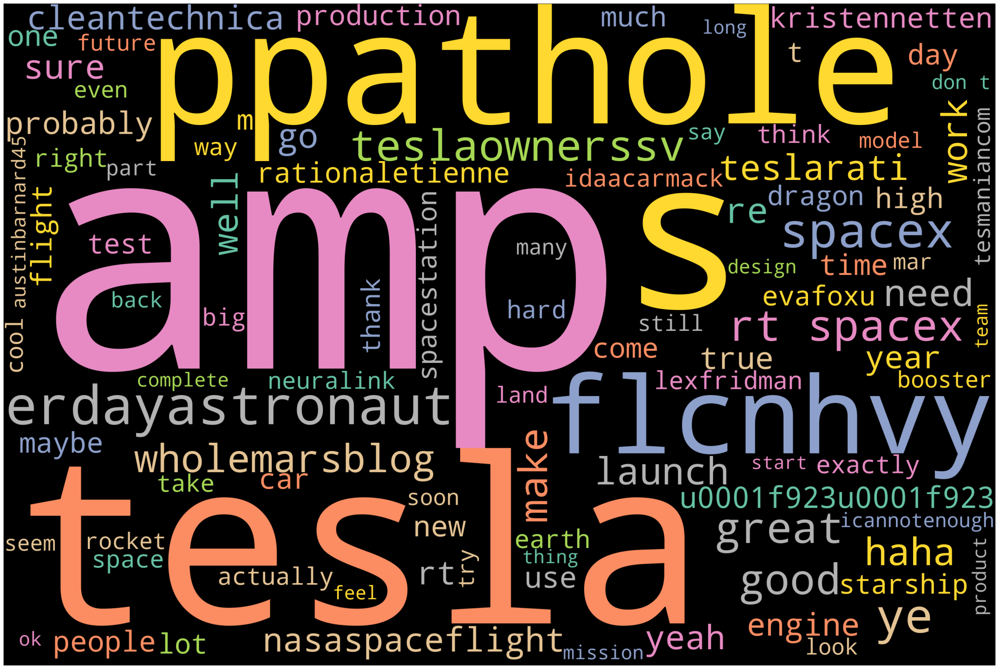

In [28]:
# Define a function to plot word cloud
def plot_cloud(wordcloud):
    plt.figure(figsize=(35,25))
    plt.imshow(wordcloud)
    plt.axis('off')
    
# Generate wordcloud

stopwords = STOPWORDS
stopwords.add('will')
wordcloud = WordCloud(width = 3000, height = 2000, background_color='black', max_words=100,colormap='Set2',stopwords=stopwords).generate(clean_tweet)
# Plot
plot_cloud(wordcloud)

In [29]:
# Part of speech  Tagging

nlp = spacy.load("en_core_web_sm")
one_block = clean_tweet
doc_block = nlp(one_block)
spacy.displacy.render(doc_block,style='ent',jupyter=True)


In [30]:
for token in doc_block:
    print(token, token.pos_)

kunalb11 NOUN
I PRON
� VERB
m VERB
alien ADJ
idaacarmack PROPN
ray NOUN
trace NOUN
cyberpunk NOUN
hdr PROPN
nextlevel NOUN
have AUX
try VERB
joerogan PROPN
spotify VERB
great ADJ
interview NOUN
gtera27 NOUN
doge PROPN
underestimate PROPN
teslacn PROPN
congratulation PROPN
tesla PROPN
china PROPN
amazing ADJ
execution NOUN
last ADJ
year NOUN
now ADV
next ADV
even ADV
happy ADJ
new ADJ
year NOUN
ox NOUN
frodo NOUN
underdoge PROPN
all DET
thought NOUN
would AUX
fail VERB
himself PRON
owenspark PROPN
flcnhvy PROPN
anonyx10 PROPN
haha VERB
thanks PROPN
flcnhvy PROPN
anonyx10 PROPN
indeed ADV
tweet PROPN
definitely ADV
represent VERB
realworld PROPN
time NOUN
allocation NOUN
the DET
entertaining ADJ
outcome NOUN
likely ADV
givedirectly ADV
just ADV
send VERB
just ADV
agree ADJ
clubhouse NOUN
kanyew PROPN
geoffkeighley PROPN
unrealengine VERB
it PRON
� VERB
s PART
get VERB
real ADJ
buy NOUN
dogecoin NOUN
lil NOUN
x NOUN
toddler NOUN
hodler NOUN
joshmanmode NOUN
he PRON
definitely ADV
issue VE

good ADJ
amp NOUN
produce NOUN
service NOUN
love NOUN
engineersfee PROPN
earth NOUN
small ADJ
amp NOUN
small NOUN
still ADV
gamespot PROPN
u0001f440 PROPN
with ADP
cyberpunk NOUN
even ADV
hotfixe PROPN
literally ADV
hotfixe PROPN
� PROPN
great ADJ
game NOUN
documentingbtc NOUN
the DET
dollar NOUN
shorting NOUN
westcoastbill PROPN
indeed ADV
johnnacrider1 NOUN
iupsychdoctor NOUN
aoc NOUN
robinhoodapp NOUN
shopify NOUN
great ADJ
spacex NOUN
use NOUN
ohqwix X
bnnj6bcghvzqxlb ADJ
u0001f923u0001f923 ADJ
wimgromman NOUN
wsbchairman NOUN
indeed ADV
the DET
economy NOUN
� NOUN
make VERB
useful ADJ
product NOUN
amp NOUN
provide VERB
great ADJ
service NOUN
� PROPN
actually ADV
matter VERB
iupsychdoctor NOUN
aoc NOUN
robinhoodapp NOUN
tanstaafl PROPN
would AUX
better VERB
small ADJ
fee NOUN
fee NOUN
latter NOUN
make VERB
robin PROPN
� PROPN
here ADV
come VERB
shorty NOUN
apologist NOUN
give VERB
respect NOUN
get VERB
shorty NOUN
u NOUN
can AUX
� VERB
t NOUN
sell VERB
house NOUN
u PROPN
don PROPN


enough ADV
haha NOUN
nasaspaceflight NOUN
sea NOUN
shanty NOUN
tiktok NOUN
take VERB
new ADJ
level NOUN
actual ADJ
pirate NOUN
ship NOUN
connectdotstoo ADV
sure ADJ
today NOUN
spacex VERB
practice NOUN
starship NOUN
engine NOUN
start VERB
ship NOUN
hold VERB
massive ADJ
pin NOUN
engine NOUN
fir NOUN
� PROPN
tesmaniancom NOUN
as SCONJ
promise VERB
legalize PROPN
comedy NOUN
lvladimirovbg PROPN
you PRON
steal VERB
namelogo PROPN
amp PROPN
probably ADV
win VERB
� PROPN
t PROPN
sue PROPN
arstechnica PROPN
sciguyspace NOUN
we PRON
� VERB
re ADV
try VERB
get VERB
people NOUN
mar PROPN
help NOUN
would AUX
appreciated VERB
spacex VERB
spacestation NOUN
one NUM
day NOUN
get VERB
camera NOUN
also ADV
show VERB
star NOUN
field NOUN
background NOUN
rt PROPN
spacex NOUN
separation NOUN
confirm VERB
dragon NOUN
perform VERB
3 NUM
departure NOUN
burn NOUN
move VERB
away ADV
spacestation NOUN
lexfridman NOUN
suicide NOUN
double ADJ
homicide NOUN
lexfridman NOUN
absolutely ADV
hey INTJ
� VERB
yeah INTJ

such ADJ
weird ADJ
game NOUN
think VERB
this DET
cgi PROPN
bensullin PROPN
we PRON
need VERB
ui PROPN
overhaul NOUN
maldivawow NOUN
codingmark PROPN
tesla VERB
no DET
incremental ADJ
improvement NOUN
production NOUN
codebase NOUN
fsd NOUN
build NOUN
be AUX
� PROPN
spacenewsinc NOUN
starlink NOUN
� PROPN
pose VERB
hazard NOUN
� PROPN
viasat VERB
� PROPN
s PROPN
profit NOUN
like INTJ
stop VERB
sneaky ADJ
move VERB
charlie PROPN
ergen PROPN
entertainment NOUN
critical ADJ
car NOUN
drive NOUN
kimpaquette PROPN
just ADV
meet VERB
larry PROPN
ellison PROPN
seek VERB
advice NOUN
back ADP
work NOUN
tesla NOUN
end NOUN
quarter NOUN
tomorrow NOUN
richierichhhhh ADJ
absolutely ADV
what PRON
tesla ADV
incar NOUN
game NOUN
autonomous ADJ
world PROPN
ppathole PROPN
wsj PROPN
absolutely ADV
tesmaniancom NOUN
taste NOUN
future NOUN
try VERB
play VERB
polytopia X
tesla NOUN
great ADJ
game NOUN
multiplayer NOUN
online ADJ
version NOUN
come VERB
soon ADV
wsj PROPN
focus NOUN
make VERB
product NOUN
amp NO

ex VERB
incredible ADJ
human ADJ
revolution NOUN
also ADV
great ADJ
cyberpunkgame NOUN
the DET
objective ADJ
reality NOUN
impossible ADJ
run NOUN
advanced ADJ
game NOUN
well NOUN
old ADJ
hardware NOUN
this PRON
be AUX
� VERB
rt PROPN
spacex VERB
starship NOUN
landing NOUN
flip NOUN
maneuver NOUN
theonion NOUN
thebabylonbee PROPN
ascent PROPN
heaven PROPN
engineersfee PROPN
u0001f923 VERB
ppathole NOUN
cyberpunkgame NOUN
yeah INTJ
briefly ADV
seem VERB
pretty ADV
good ADJ
I PRON
pick VERB
nomad PROPN
start VERB
little ADJ
slow ADJ
pick NOUN
up ADP
� PROPN
zwiebelbach PRON
itsmenieb PROPN
cyberpunkgame PROPN
hehe PROPN
cyberpunkgame PROPN
cyberpunkgame PROPN
rt PROPN
spacex VERB
falcon NOUN
9 NUM
launch NOUN
sxm7 NOUN
orbit NOUN
completing NOUN
spacex VERB
� PROPN
s PART
25th ADJ
launch NOUN
year NOUN
quantamagazine NOUN
init VERB
void ADJ
ppathole NOUN
ercxspace NOUN
spacex VERB
cool ADJ
haha NOUN
ppathole NOUN
ercxspace NOUN
spacex VERB
I PRON
still ADV
soft ADJ
spot NOUN
heart NOUN
tr

flight NOUN
next ADJ
week NOUN
goal NOUN
test NOUN
3 NUM
engin NOUN
� VERB
erdayastronaut NOUN
marcushousegame VERB
maybe ADV
start VERB
year NOUN
depend VERB
starship NOUN
progress NOUN
go VERB
rationaletienne PROPN
marcushousegame PROPN
not PART
yet ADV
starshipfaire VERB
marcushousegame NOUN
not PART
bad ADJ
we PRON
definitely ADV
need VERB
engine NOUN
make VERB
cargo NOUN
bay NOUN
propel PROPN
� PROPN
marcushousegame VERB
rapid ADJ
amp NOUN
complete ADJ
rocket NOUN
reuse VERB
low ADJ
cost NOUN
propellant NOUN
orbital ADJ
refill NOUN
amp NOUN
propellant NOUN
production NOUN
d X
� VERB
erdayastronaut NOUN
ppathole NOUN
teslarati NOUN
teslaroadtrip VERB
yes INTJ
ppathole NOUN
teslarati NOUN
teslaroadtrip VERB
we PRON
� VERB
re ADP
still ADV
far ADV
simply ADV
video NOUN
control NOUN
the DET
big ADJ
gamechanger NOUN
cu NOUN
� PROPN
teslarati NOUN
teslaroadtrip VERB
fsd NOUN
beta NOUN
5 NUM
come NOUN
day NOUN
improvement NOUN
significant ADJ
xhnew NOUN
exciting ADJ
mission NOUN
vincent1

of ADP
� PROPN
erdayastronaut NOUN
rweb11742 PROPN
the DET
amazing ADJ
thing NOUN
rocket NOUN
engine NOUN
sometimes ADV
don PROPN
� PROPN
t NOUN
blow VERB
the DET
� ADJ
pcgamer NOUN
we PRON
count VERB
atom PROPN
point PROPN
djsnm PROPN
erdayastronaut PROPN
charlesnotrump PROPN
rweb11742 PROPN
absolutely ADV
productionteste PROPN
rocket NOUN
engine NOUN
90 NUM
of ADP
� PROPN
erdayastronaut NOUN
charlesnotrump NOUN
rweb11742 PROPN
our PRON
first ADJ
merlin PROPN
engine NOUN
design NOUN
really ADV
bad ADJ
tbh NOUN
nothing PRON
work VERB
well ADV
� VERB
billhuang688 NOUN
johnnacrider1 PROPN
timmerenginerd PROPN
jack PROPN
maybe ADV
I PRON
love VERB
irony NOUN
haha INTJ
greenisclutch PROPN
johnnacrider1 NOUN
timmerenginerd NOUN
jack NOUN
they PRON
� VERB
re ADP
way NOUN
hopefully ADV
teslaquila NOUN
next ADJ
month NOUN
chrisgnsf NOUN
special ADJ
permission NOUN
receive VERB
stonecutter NOUN
guild NOUN
johnnacrider1 NOUN
timmerenginerd PROPN
jack PROPN
fate PROPN
u0001f5a4 PROPN
irony NOUN
j

� VERB
the DET
carousel NOUN
turn VERB
ever ADV
fast ADJ
joeingeneral ADJ
andrewbogut NOUN
yup INTJ
ajtourville PROPN
exactly ADV
janeidyeve VERB
symptom NOUN
typical ADJ
cold ADJ
nothing PRON
unusual ADJ
far ADJ
blkmdl3 NOUN
if SCONJ
it PRON
� VERB
s PART
happen AUX
it PRON
� VERB
s PART
happen VERB
other ADJ
I PRON
� VERB
m AUX
get VERB
pcr ADJ
test NOUN
separate ADJ
lab NOUN
result NOUN
take VERB
24 NUM
hour NOUN
something PRON
extremely ADV
bogus ADJ
go VERB
be AUX
test NOUN
covid VERB
four NUM
time NOUN
today NOUN
two NUM
test NOUN
come VERB
back ADV
negative ADJ
two NUM
cam NOUN
� PROPN
austinbarnard45 NOUN
burst ADJ
disk NOUN
work NOUN
vehicle NOUN
appear VERB
ok INTJ
we PRON
� VERB
ll AUX
swap VERB
least ADJ
one NUM
engine NOUN
tobyliiiiiiiiii NOUN
spacepadreisle NOUN
austinbarnard45 PROPN
maybe ADV
melt VERB
engine NOUN
preburner NOUN
fuel NOUN
hot ADJ
gas NOUN
manifold NOUN
whatev NOUN
� NOUN
austinbarnard45 NOUN
we PRON
lose VERB
vehicle NOUN
pneumatics NOUN
reason NOUN
unkn

point NOUN
probability NOUN
fault NOUN
wi PROPN
� PROPN
teslaownerssv VERB
teslatino ADJ
we PRON
measure VERB
primarily ADV
intervention VERB
probability NOUN
this DET
update NOUN
address NOUN
several ADJ
issu ADJ
� PROPN
teslatino NOUN
thank VERB
great ADJ
autopilotai NOUN
team NOUN
work NOUN
super ADV
hard ADV
do AUX
� VERB
neural ADJ
net ADJ
� PROPN
without ADP
test NOUN
again ADV
� VERB
auchenberg NOUN
latency NOUN
improve VERB
significantly ADV
soon ADV
bandwidth ADV
teslaownerssv VERB
this PRON
build NOUN
noticeably ADV
well ADV
intervention NOUN
rationaletienne PROPN
teslaownerssv PROPN
toadmeister PROPN
yes INTJ
teslaownerssv INTJ
toadmeister NOUN
I PRON
� VERB
ve AUX
spend VERB
half DET
life NOUN
california PROPN
amp NOUN
love NOUN
state NOUN
but CCONJ
frankly ADV
I PRON
think VERB
� VERB
toadmeister NOUN
and CCONJ
� PROPN
sweden NOUN
still ADV
right ADV
zero NUM
death NOUN
oct ADP
29 NUM
tocnewyorkstate NOUN
true ADJ
also ADV
few ADJ
heart NOUN
attack NOUN
way NOUN
easy ADJ
p

would AUX
quite ADV
trip VERB
cinotpyrc NOUN
that PRON
� PROPN
s PART
kid ADJ
haha NOUN
m AUX
� VERB
t NOUN
� PROPN
r NOUN
tr ADP
� PROPN
nd PROPN
� PROPN
techamazing VERB
look VERB
like ADP
snoopy NOUN
tesmaniancom VERB
current ADJ
production NOUN
slightly ADV
well ADV
bamtheteslaman1 PROPN
cleantechnica PROPN
doesn PROPN
� PROPN
t NOUN
seem VERB
life NOUN
solar ADJ
system NOUN
maybe ADV
ice NOUN
europa NOUN
or CCONJ
� VERB
rt PROPN
tesmaniancom PROPN
tesla PROPN
model PROPN
3 NUM
sr PROPN
have VERB
low ADJ
energy NOUN
consumption NOUN
all DET
bevs NOUN
say VERB
report PROPN
cleantechnica PROPN
very ADV
creative ADJ
flcnhvy NOUN
that SCONJ
free ADJ
fusion NOUN
reactor NOUN
sky NOUN
conveniently ADV
convert VERB
4 NUM
million NUM
ton NOUN
mass NOUN
energy NOUN
every DET
second ADJ
� NOUN
kristennetten VERB
teslaownerssv VERB
you PRON
never ADV
know VERB
ppathole NOUN
after SCONJ
xbox PROPN
u0001f622 PROPN
whatsupfranks PROPN
kimpaquette PROPN
also ADV
system VERB
autodelete ADJ
old ADJ

alexavoigt PROPN
mikezimon PROPN
wholemarsblog NOUN
d PROPN
� PROPN
ner PROPN
kebab PROPN
tribehoh NOUN
spacex VERB
wastatecommerce NOUN
you PRON
� VERB
re ADP
welcome ADJ
brendan2908 PROPN
bocachicagal ADJ
nasaspaceflight NOUN
high ADJ
bay NOUN
finish NOUN
except SCONJ
giant ADJ
gantry NOUN
crane NOUN
within ADP
� PROPN
alexavoigt PROPN
mikezimon PROPN
wholemarsblog NOUN
that PRON
look VERB
tasty ADJ
tesladri NOUN
chananbo PROPN
raytech247 VERB
wholemarsblog VERB
the DET
crash NOUN
absorption NOUN
rail NOUN
cut VERB
amp NOUN
replace NOUN
bolt NOUN
part NOUN
collision NOUN
repair NOUN
icannotenough ADJ
wholemarsblog NOUN
sandy ADJ
munro NOUN
understand VERB
engineering PROPN
flcnhvy PROPN
teslaownerssv NOUN
raytech247 PROPN
wholemarsblog NOUN
that PRON
would AUX
like VERB
license NOUN
battlestar NOUN
galactica PROPN
actually ADV
buil PROPN
� PROPN
teslaownerssv NOUN
raytech247 VERB
wholemarsblog NOUN
yes INTJ
gigafactory ADJ
hard ADJ
amp NOUN
critical ADJ
product NOUN
chananbo NOUN
ray

cashmoneylemon PROPN
cathiedwood NOUN
skorusark PROPN
total ADJ
market NOUN
cathiedwood NOUN
skorusark NOUN
seven NUM
year NOUN
sure ADJ
30 NUM
m VERB
new ADJ
fully ADV
electric ADJ
vehicle NOUN
per ADP
year NOUN
six NUM
year NOUN
maybe ADV
five NUM
ye PROPN
� PROPN
flcnhvy PROPN
cathiedwood PROPN
both CCONJ
original ADJ
car NOUN
cathiedwood NOUN
we PRON
aren VERB
� PROPN
t NOUN
cut VERB
price NOUN
model NOUN
3 NUM
25k NOUN
I PRON
refer VERB
future ADJ
car NOUN
small ADJ
model NOUN
3 NUM
brianheide NOUN
tesla NOUN
what PRON
heavy ADJ
duty NOUN
paintball NOUN
machine NOUN
gun NOUN
mount PROPN
bed NOUN
rail NOUN
pickenheim PROPN
matthewkerle PROPN
new ADJ
version NOUN
come VERB
soon ADV
wholemarsblog ADJ
supplier NOUN
we PRON
� VERB
re VERB
high ADJ
energy NOUN
nickel NOUN
least ADJ
also ADV
maybe ADV
presenta VERB
� PROPN
teslagong NOUN
drsallyl NOUN
sydneyev ADJ
teslatom NOUN
teslastraya NOUN
outbacktesla PROPN
evoutback PROPN
michael01996367 PROPN
cvanderstock NOUN
� NOUN
scottadamssa

u0001f5a4 PROPN
fallout PROPN
radio NOUN
u0001f5a4 NOUN
tjlk VERB
there PRON
eerie VERB
parallel VERB
the DET
bore NOUN
company NOUN
amp NOUN
vaulttec ADV
we PRON
also ADV
build VERB
first ADJ
demonstration NOUN
tunnelvault NOUN
la ADP
double ADJ
underground ADJ
nuclear ADJ
shelter NOUN
u0001f600u0001f44d PROPN
flcnhvy PROPN
lexfridman PROPN
yeah INTJ
tesladri NOUN
idaacarmack NOUN
lexfridman NOUN
should AUX
happen VERB
soon ADV
idaacarmack NOUN
lexfridman NOUN
a DET
bit NOUN
obscure ADJ
starhammer NOUN
amp NOUN
stainless ADJ
steel NOUN
rat NOUN
engineersfee NOUN
at ADP
first ADV
I PRON
think VERB
parrot VERB
johnnacrider1 NOUN
jhall NOUN
they PRON
remind VERB
guy NOUN
story NOUN
life NOUN
tunnel NOUN
city NOUN
selfdrive ADJ
electric ADJ
car NOUN
feel VERB
like ADP
warp ADJ
drive NOUN
first ADJ
operational ADJ
tunnel NOUN
vega PROPN
� PROPN
jackfarrington PROPN
for ADP
sure PROPN
jackfarrington PROPN
tesla PROPN
good ADJ
point NOUN
have VERB
hug NOUN
tunnel NOUN
today NOUN
arkinv PROPN

field NOUN
forever ADV
spceenthusiast ADJ
tjmurphymit VERB
thesheetztweetz PROPN
exploremar PROPN
spacex VERB
theespacedude NOUN
over ADP
time NOUN
outer ADJ
20 NUM
3 NUM
� PROPN
spceenthusiast ADJ
tjmurphymit VERB
thesheetztweetz NOUN
exploremar PROPN
spacex NOUN
theespacedude NOUN
yeah INTJ
alertalarm NOUN
just ADV
go VERB
resonant ADJ
mode NOUN
fast ADV
it PRON
� VERB
s PART
hang PROPN
problem PROPN
arise VERB
tjmurphymit PROPN
thesheetztweetz PROPN
exploremar PROPN
spacex NOUN
theespacedude VERB
the DET
outer ADJ
ring NOUN
booster NOUN
engine NOUN
20 NUM
28 NUM
hav NOUN
� PROPN
erdayastronaut PROPN
flcnhvy PROPN
gerberkawasaki PROPN
videodrome VERB
teslaownerssv NOUN
justpaulinelol X
teslaownerssv X
justpaulinelol X
teslaownerssv NOUN
justpaulinelol ADJ
sorry ADJ
sir NOUN
I PRON
think VERB
I PRON
momentinertiaphobia VERB
rt PROPN
spacex VERB
falcon PROPN
9 NUM
first ADJ
stage NOUN
land NOUN
land NOUN
zone NOUN
1 NUM
complete ADJ
booster NOUN
� PROPN
s PART
fourth ADJ
flight NOUN
fr

propellant NOUN
production NOUN
could AUX
get VERB
� PROPN
erdayastronaut NOUN
dauqhx VERB
universalsci PROPN
starship NOUN
propellant PROPN
78 NUM
oxygen NOUN
o2 PROPN
plant NOUN
moon NOUN
would AUX
enou VERB
� PROPN
waitbutwhy SCONJ
now ADV
I PRON
want VERB
candy NOUN
dauqhx NOUN
universalsci NOUN
there ADV
� PROPN
s PART
lot NOUN
frozen ADJ
co2 NOUN
amp PROPN
h2o PROPN
mars PROPN
heating NOUN
planet NOUN
densify NOUN
atmosphere NOUN
it PRON
� VERB
s PART
solvable ADJ
universalsci PROPN
perhaps ADV
one NUM
day NOUN
ocean NOUN
northern PROPN
part PROPN
mars PROPN
jchybow PROPN
jwangark PROPN
wintonark NOUN
it PRON
� VERB
s PRON
almost ADV
work VERB
reliably ADV
jwangark ADJ
wintonark ADJ
very ADV
different ADJ
computer NOUN
need VERB
training NOUN
vs ADP
inference NOUN
fsd NOUN
mostly ADV
int8 NOUN
dojo NOUN
be AUX
� VERB
jwangark NOUN
wintonark ADJ
not PART
exactly ADV
gpus PROPN
nn NOUN
lot NOUN
core NOUN
optimize VERB
dot NOUN
product NOUN
fast ADV
local ADJ
memory NOUN
amp NOUN
su

investor NOUN
� PROPN
part NOUN
tesla VERB
wrong ADJ
that PRON
bs NOUN
push VERB
eberhard ADJ
bad ADJ
person NOUN
I PRON
� VERB
ve AUX
ever ADV
� VERB
universalsci NOUN
also ADV
could AUX
long ADV
period NOUN
comet NOUN
intersect ADJ
earth NOUN
right NOUN
we PRON
haven VERB
� PROPN
t NOUN
observe VERB
the DET
� PROPN
universalsci PROPN
pretty ADV
much ADV
cybertruck ADJ
option NOUN
package NOUN
stevestuwill NOUN
jagarikin PROPN
wow PROPN
boosterbuddie PROPN
nasaspaceflight VERB
my PRON
buttontwiddling NOUN
make VERB
sense NOUN
u0001f923u0001f923 PROPN
flcnhvy PROPN
nickcappelli PROPN
grimezsz NOUN
you PRON
get VERB
evafoxu ADV
that PRON
� PROPN
s PART
great ADJ
one NUM
� PROPN
tank NOUN
4 NUM
memery NOUN
� PROPN
panzer NOUN
lake NOUN
some DET
big ADJ
milestone NOUN
come VERB
drphiltill PROPN
africa PROPN
big ADJ
awardsdarwin PROPN
bold ADJ
move NOUN
sir PROPN
bold PROPN
move VERB
euricsanti PROPN
luisabinader NOUN
tesla NOUN
thank VERB
tesla ADJ
honor NOUN
cowderysedge VERB
tbdnonymous

leg NOUN
amp NOUN
repair NOUN
probably ADV
sn6 ADV
fly VERB
sn5 INTJ
we PRON
need VERB
� PROPN
lexfridman NOUN
clearly ADV
rt PROPN
erdayastronaut PROPN
spot PROPN
tiny ADJ
human NOUN
this DET
shot NOUN
really ADV
put VERB
scale NOUN
a DET
full ADJ
blown ADJ
starship NOUN
superheavy X
hard ADJ
fat ADJ
� PROPN
ramacvr NOUN
kristennetten VERB
ppathole NOUN
berniesander NOUN
also ADV
true ADJ
kristennetten ADJ
ppathole NOUN
berniesander NOUN
u0001f923u0001f923 ADJ
ppathole NOUN
berniesander NOUN
over ADP
time NOUN
since SCONJ
give VERB
employee NOUN
share NOUN
ownership NOUN
dilute NOUN
automatically ADV
from ADP
� PROPN
rt PROPN
theplanetaryguy NOUN
video NOUN
like SCONJ
always ADV
amaze VERB
astronomer PROPN
jan PROPN
koet PROPN
capture NOUN
video NOUN
2007 NUM
saturn NOUN
appear VERB
behind ADP
t DET
� PROPN
rationaletienne NOUN
berniesander NOUN
I PRON
wonder VERB
read VERB
twitter NOUN
feed NOUN
berniesander NOUN
and CCONJ
aim VERB
attack NOUN
tesla NOUN
we PRON
� VERB
re ADP
company

of ADP
� PROPN
keith31345919 PROPN
ppathole NOUN
keith31345919 PROPN
ppathole NOUN
we PRON
� VERB
ve AUX
work VERB
4 NUM
year NOUN
originally ADV
mean VERB
rabie NOUN
vaccine NOUN
it PRON
� VERB
keith31345919 PROPN
ppathole NOUN
ppathole NOUN
u0001f3b6 PROPN
billy ADV
g PROPN
lover PROPN
u0001f3b6 PROPN
ppathole PROPN
sound NOUN
like ADP
doesn PROPN
� PROPN
t NOUN
realize VERB
tesla NOUN
make VERB
vaccine NOUN
machine NOUN
curevac ADJ
mkarolian ADJ
tesla NOUN
thank VERB
let VERB
know VERB
will AUX
dig VERB
greendragonbot PROPN
u0001f609 PROPN
thesheetztweetz PROPN
sum NOUN
gt NOUN
part NOUN
teslarati NOUN
should AUX
add VERB
mile NOUN
range NOUN
slow ADJ
traffic NOUN
kristennetten VERB
xiangaw PROPN
owenspark NOUN
berniesander VERB
the DET
government NOUN
money NOUN
far ADV
they PRON
talk VERB
trillion NUM
jgrano305 ADJ
teslaownersnbay NOUN
haha VERB
one NUM
ever ADV
top ADJ
secret ADJ
fart NOUN
technology NOUN
teslaownersnbay PROPN
u0001f495 PROPN
u0001f495 PROPN
samlopezxx PROPN
tesl

both DET
fair ADJ
half ADJ
catch NOUN
space NOUN
spacex NOUN
ship NOUN
rt PROPN
spacex VERB
falcon PROPN
9 NUM
� PROPN
s PART
first ADJ
stage NOUN
land NOUN
just ADV
read VERB
instruction NOUN
droneship NOUN
spacex VERB
nice ADJ
work NOUN
spacex NOUN
team NOUN
flcnhvy PROPN
astrobehnken VERB
astrodoug NOUN
spacex VERB
still ADV
long ADJ
way NOUN
go VERB
reuse VERB
matter NOUN
degree NOUN
it PRON
� VERB
s PART
rapid ADJ
amp NOUN
complete NOUN
nasahqphoto NOUN
too ADV
long ADV
since SCONJ
last ADJ
launch NOUN
20 NUM
min PROPN
wholemarsblog PROPN
cleantechnica PROPN
in ADP
month NOUN
production NOUN
release NOUN
already ADV
alpha NOUN
build PROPN
cleantechnica PROPN
lithium NOUN
extremely ADV
common ADJ
earth NOUN
find VERB
almost ADV
everywhere ADV
nishy03 PROPN
hiromichimizuno PROPN
congratulations PROPN
mhi PROPN
amp PROPN
uae PROPN
bar2 PROPN
t NOUN
joebangles11 PROPN
teslarati PROPN
stilton PROPN
kristennetten VERB
businessinsider NOUN
new ADJ
deep ADJ
crimson ADJ
giga NOUN
berlin PR

ihearttesla ADJ
absolutely ADV
teslaparatodo ADP
evafoxu PROPN
tesla PROPN
u0001f440 PROPN
mjkapkan PROPN
evafoxu PROPN
tesla VERB
probably ADV
good ADJ
one NUM
design NOUN
amp NOUN
engineer PROPN
germany PROPN
bluebnd PROPN
evafoxu ADV
tesla VERB
even ADV
techgnostik NOUN
evafoxu ADV
tesla ADJ
ok PROPN
scr00chy PROPN
evafoxu PROPN
tesla PROPN
u0001f440 PROPN
evafoxu PROPN
tesla PROPN
berlin PROPN
model PROPN
y PROPN
one NUM
watch VERB
that DET
revolution NOUN
automotive ADJ
body NOUN
engineering NOUN
finally ADV
burakaydik VERB
true ADJ
wow INTJ
ihop NOUN
amp NOUN
github NOUN
close VERB
good ADJ
use NOUN
term NOUN
� VERB
full ADJ
stack NOUN
� PROPN
ppathole NOUN
ihearttesla ADJ
for ADP
sure ADV
this DET
great ADJ
amp NOUN
terrify VERB
everything PRON
we PRON
� VERB
ve AUX
ever ADV
sense NOUN
thought VERB
be AUX
� VERB
redmercy NOUN
yes INTJ
buzzindelhi VERB
sorry INTJ
hopefully ADV
soon ADV
kenyanwalstreet NOUN
not PART
actually ADV
payout VERB
vest ADJ
stock NOUN
option NOUN
it PRON


In [31]:
#filtering for nouns and verbs only 
noun_verb = [token.text for token in doc_block if  token.pos_ in  ('NOUN', 'VERB')]
print(noun_verb)

['kunalb11', '�', 'm', 'ray', 'trace', 'cyberpunk', 'nextlevel', 'try', 'spotify', 'interview', 'gtera27', 'execution', 'year', 'year', 'ox', 'frodo', 'thought', 'fail', 'haha', 'represent', 'time', 'allocation', 'outcome', 'send', 'clubhouse', 'unrealengine', '�', 'get', 'buy', 'dogecoin', 'lil', 'x', 'toddler', 'hodler', 'joshmanmode', 'issue', 'sentencing', 'seem', 'thank', 'fix', 'unlock', 'account', 'astrojordy', 'u0001f923u0001f923', 'power', 'haha', 'freewalletorg', 'wallet', 'win', 't', 'give', 'key', 'avoid', 'cost', 'app', 'suck', 'spacex', 'launch', 'element', 'gateway', 'mission', 'blkmdl3', 'predict', 'cash', 'flow', 'starlink', 'adamklotz', 'starlink', 'amp', 'endeavor', 'rationaletienne', 'adamklotz', 'pass', 'chasm', 'cash', 'flow', 'year', '�', 'idaacarmack', 'cost', 'ton', 'carbon', 'sequester', 'value', 'product', 'make', 'scalable', 'g', '�', 'adamklotz', '�', 'price', 'country', 'difference', 'taxis', 'amp', 'shipping', 'tobyliiiiiiiiii', 'earth', 'idea', 'apply', 

In [32]:
#counting tokens again
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer()

X = cv.fit_transform(noun_verb)
sum_words = X.sum(axis=0)
words_frequency = [(word,sum_words[0,idx]) for word, idx in cv.vocabulary_.items()]
words_frequency = sorted(words_frequency,key = lambda x: x[1],reverse=True)
wf_df = pd.DataFrame(words_frequency)
wf_df.columns = ['word', 'count']

wf_df

,word,count
0,spacex,228
1,amp,182
2,tesla,96
3,ppathole,96
4,erdayastronaut,77
...,...,...
2482,dire,1
2483,priority,1
2484,propaganda,1
2485,clicking,1


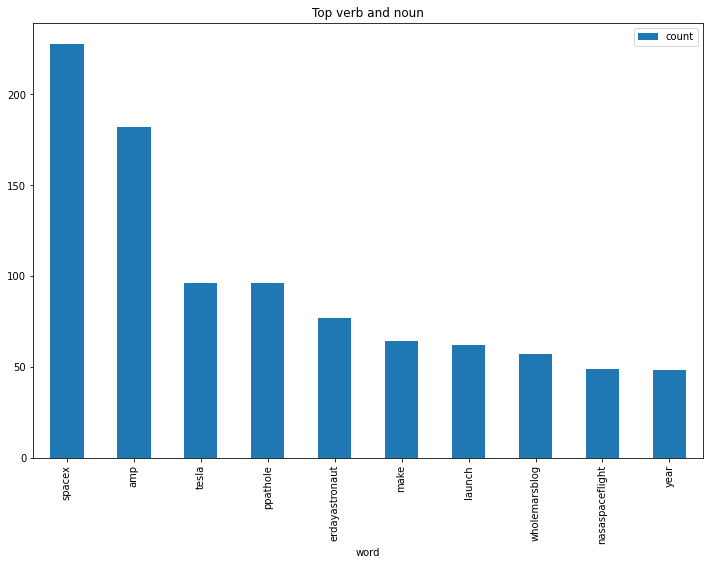

In [33]:
#Visualizing results
# Barchart for top 10 nouns + verbs
wf_df[0:10].plot.bar(x='word',figsize = (12,8),title='Top verb and noun')
plt.show()

## Emotion Mining - sentiment analysis

In [34]:
from nltk import tokenize
sentence = tokenize.sent_tokenize(' '.join(elon_musk_data))
sentence

['@kunalb11 I�m an alien @ID_AA_Carmack Ray tracing on Cyberpunk with HDR is next-level.',
 'Have you tried it?',
 '@joerogan @Spotify Great interview!',
 '@gtera27 Doge is underestimated @teslacn Congratulations Tesla China for amazing execution last year.',
 'Now on to the next for even more!!',
 'Happy New Year of the Ox!',
 'https://t.co/9WFKMYu2oj Frodo was the underdoge,\nAll thought he would fail,\nHimself most of all.',
 'https://t.co/zGxJFDzzrM @OwenSparks_ @flcnhvy @anonyx10 Haha thanks :) @flcnhvy @anonyx10 Indeed!',
 'Tweets definitely do not represent real-world time allocation.',
 'The most entertaining outcome is the most likely @GiveDirectly Just sent some Just agree to do Clubhouse with @kanyewest https://t.co/3rWE9uHSTS @geoffkeighley @UnrealEngine It�s getting real Bought some Dogecoin for lil X, so he can be a toddler hodler @JoshManMode He definitely has issues, but the sentencing seems a bit high @freewalletorg Thanks for fixing @freewalletorg Please unlock my acc

In [35]:
sent_dataframe = pd.DataFrame(sentence,columns=['sentence'])
sent_dataframe

,sentence
0,@kunalb11 I�m an alien @ID_AA_Carmack Ray trac...
1,Have you tried it?
2,@joerogan @Spotify Great interview!
3,@gtera27 Doge is underestimated @teslacn Congr...
4,Now on to the next for even more!!
...,...
909,"@kenyanwalstreet Not actually a payout, just a..."
910,"It may never pay out, as the stock can�t b� ht..."
911,Details Aug 28.
912,AI symbiosis while u wait @vistacruiser7 @flcn...


In [36]:
# Emotion Lexican - Affin
affin = pd.read_csv('Afinn.csv',sep=',',encoding='Latin-1')
affin

,word,value
0,abandon,-2
1,abandoned,-2
2,abandons,-2
3,abducted,-2
4,abduction,-2
...,...,...
2472,yucky,-2
2473,yummy,3
2474,zealot,-2
2475,zealots,-2


In [37]:
affinity_score = affin.set_index('word')['value'].to_dict()
affinity_score

{'abandon': -2,
 'abandoned': -2,
 'abandons': -2,
 'abducted': -2,
 'abduction': -2,
 'abductions': -2,
 'abhor': -3,
 'abhorred': -3,
 'abhorrent': -3,
 'abhors': -3,
 'abilities': 2,
 'ability': 2,
 'aboard': 1,
 'absentee': -1,
 'absentees': -1,
 'absolve': 2,
 'absolved': 2,
 'absolves': 2,
 'absolving': 2,
 'absorbed': 1,
 'abuse': -3,
 'abused': -3,
 'abuses': -3,
 'abusive': -3,
 'accept': 1,
 'accepted': 1,
 'accepting': 1,
 'accepts': 1,
 'accident': -2,
 'accidental': -2,
 'accidentally': -2,
 'accidents': -2,
 'accomplish': 2,
 'accomplished': 2,
 'accomplishes': 2,
 'accusation': -2,
 'accusations': -2,
 'accuse': -2,
 'accused': -2,
 'accuses': -2,
 'accusing': -2,
 'ache': -2,
 'achievable': 1,
 'aching': -2,
 'acquit': 2,
 'acquits': 2,
 'acquitted': 2,
 'acquitting': 2,
 'acrimonious': -3,
 'active': 1,
 'adequate': 1,
 'admire': 3,
 'admired': 3,
 'admires': 3,
 'admiring': 3,
 'admit': -1,
 'admits': -1,
 'admitted': -1,
 'admonish': -2,
 'admonished': -2,
 'adopt': 

In [38]:
# Custom function: score each word in a sentence in lemmatised form, but calculate the score for the whole original sentence
nlp=spacy.load('en_core_web_sm')
sentiment_lexicon=affinity_score

def calculate_sentiment(text:str=None):
    sent_score=0
    if text:
        sentence=nlp(text)
        for word in sentence:
            sent_score+=sentiment_lexicon.get(word.lemma_,0)
    return sent_score

In [39]:
# test that it works
calculate_sentiment(text = 'amazing')

4

In [40]:
sent_dataframe['sentiment_value'] = sent_dataframe['sentence'].apply(calculate_sentiment)

In [41]:
# how many words are in the sentence?
sent_dataframe['word_count'] = sent_dataframe['sentence'].str.split().apply(len)
sent_dataframe['word_count']

0      13
1       4
2       4
3      13
4       8
       ..
909    11
910    31
911     3
912    47
913    15
Name: word_count, Length: 914, dtype: int64

In [42]:
sent_dataframe.sort_values(by='sentiment_value')

,sentence,sentiment_value,word_count
640,Very ba� https://t.co/tJsh1Exz1Q @justpaulinel...,-8,60
828,Cool Model 3 review by @iamjamiefoxx https://t...,-7,61
64,"Also, the road to hell is mostly paved with ba...",-7,11
473,"He plays the �poor inventor� card, but was ric...",-5,34
910,"It may never pay out, as the stock can�t b� ht...",-4,31
...,...,...,...
638,It�s� https://t.co/IxhyT6NuiC @Teslarati Tesla...,13,65
578,The �open� areas� https://t.co/rabjKrtQlw @Sav...,14,138
710,We just haven�t observed the� https://t.co/mez...,15,72
36,"@ajtourville @Erdayastronaut @SpaceX Yes, but ...",16,231


In [43]:
# Sentiment score of the whole review
sent_dataframe['sentiment_value'].describe()

count    914.000000
mean       1.374179
std        2.704916
min       -8.000000
25%        0.000000
50%        0.000000
75%        3.000000
max       16.000000
Name: sentiment_value, dtype: float64

In [44]:
# negative Sentiment score of the whole review
sent_dataframe[sent_dataframe['sentiment_value']<=0]

,sentence,sentiment_value,word_count
0,@kunalb11 I�m an alien @ID_AA_Carmack Ray trac...,0,13
1,Have you tried it?,0,4
4,Now on to the next for even more!!,0,8
5,Happy New Year of the Ox!,0,6
6,https://t.co/9WFKMYu2oj Frodo was the underdog...,-2,14
...,...,...,...
909,"@kenyanwalstreet Not actually a payout, just a...",0,11
910,"It may never pay out, as the stock can�t b� ht...",-4,31
911,Details Aug 28.,0,3
912,AI symbiosis while u wait @vistacruiser7 @flcn...,-2,47


In [45]:
# positive sentiment score of the whole review
sent_dataframe[sent_dataframe['sentiment_value']>0]

,sentence,sentiment_value,word_count
2,@joerogan @Spotify Great interview!,3,4
3,@gtera27 Doge is underestimated @teslacn Congr...,3,13
7,https://t.co/zGxJFDzzrM @OwenSparks_ @flcnhvy ...,2,10
9,The most entertaining outcome is the most like...,7,109
17,Back to work I go � @CapybaraSurfer @MattWalla...,4,39
...,...,...,...
901,He was one of the very best.,3,7
903,"@Ali_Afshari In general, we need to improve ho...",4,87
905,"@burakaydik True Wow, IHOP &amp; GitHub are cl...",3,15
907,This is both great &amp; terrifying.,3,6


In [46]:
# Adding index cloumn
sent_dataframe['index']=range(0,len(sent_dataframe))
sent_dataframe

,sentence,sentiment_value,word_count,index
0,@kunalb11 I�m an alien @ID_AA_Carmack Ray trac...,0,13,0
1,Have you tried it?,0,4,1
2,@joerogan @Spotify Great interview!,3,4,2
3,@gtera27 Doge is underestimated @teslacn Congr...,3,13,3
4,Now on to the next for even more!!,0,8,4
...,...,...,...,...
909,"@kenyanwalstreet Not actually a payout, just a...",0,11,909
910,"It may never pay out, as the stock can�t b� ht...",-4,31,910
911,Details Aug 28.,0,3,911
912,AI symbiosis while u wait @vistacruiser7 @flcn...,-2,47,912


E:\ANACONDA\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


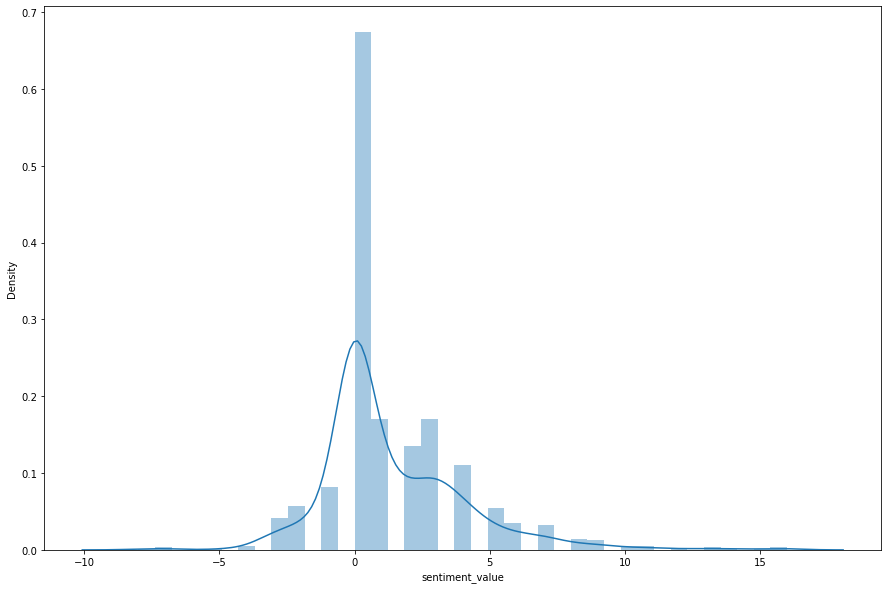

In [47]:
# Plotting the sentiment value for whole review
import seaborn as sns
plt.figure(figsize=(15,10))
sns.distplot(sent_dataframe['sentiment_value'])
None


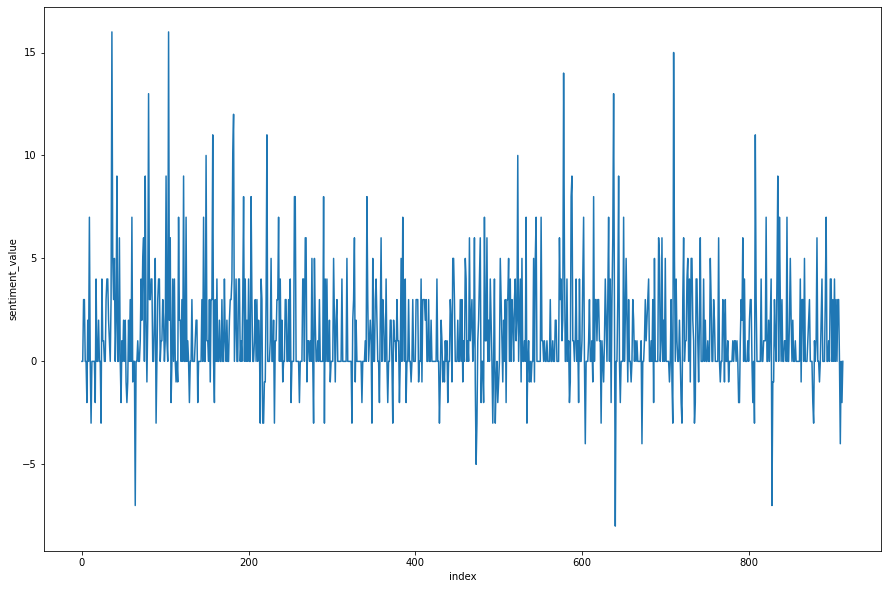

In [48]:
# Plotting the line plot for sentiment value of whole review
plt.figure(figsize=(15,10))
sns.lineplot(y='sentiment_value',x='index',data=sent_dataframe)
plt.show()

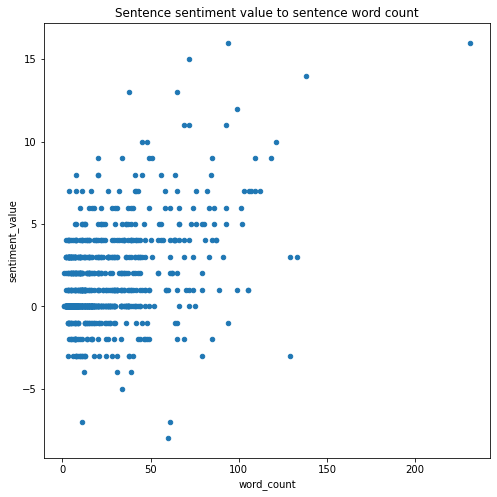

In [49]:
# Correlation analysis
sent_dataframe.plot.scatter(x='word_count',y='sentiment_value',figsize=(8,8),title='Sentence sentiment value to sentence word count')
None

In [60]:
import plotly.express as px 

In [64]:
fig = px.bar(sent_dataframe[:20], x='word_count', y='sentiment_value', title='Counts of top bigrams', template='plotly_white', labels={'ngram': 'Bigram', 'count': 'Count'})
fig.show()

In [69]:
fig = px.treemap(sent_dataframe, title='Treemap chart by companies and whether complaint mentions credit report.',
                 path=['word_count','sentiment_value'], color='sentence', color_continuous_scale=px.colors.sequential.GnBu)
fig.show()

In [71]:
fig = px.bar(sent_dataframe, x='word_count', y='sentiment_value', template='plotly_white', orientation='h',
             labels={'portion': '% of Complaints', 'bigram': 'Bigram', 'company': 'Company'},
             color='sentence', color_discrete_sequence=px.colors.qualitative.Safe)
fig.update_layout(font=dict(size=10, color='DarkSlateGray'))
fig.update_layout(width=1200, height=500)
fig.show()

In [86]:
fig = px.bar(sent_dataframe,  x='word_count', y='sentiment_value'
             , color='sentence', template='plotly_white', color_discrete_sequence=px.colors.qualitative.Bold
             , labels={'word_count', 'sentiment_value'})
fig.update_layout(legend_orientation="h")
fig.update_layout(legend=dict(x=0.1, y=1.1))
fig.update_yaxes(title='', showticklabels=False)
fig.show()

# =======================================================

#### let us see how to visualise relation between part of speech    ### just for  example

In [55]:
import spacy
nlp=spacy.load('en_core_web_sm')
from spacy import displacy
doc=nlp(u'Anil is working on ExcelR assignment.')

import warnings 
warnings.filterwarnings('ignore') 
from matplotlib import pyplot as plt

In [56]:
displacy.render(doc, style='dep')
plt.show()

In [57]:
### Now let’s fill in a few colors to this representation with some options:

In [58]:
doc1=nlp(u'I am working on ExcelR assignment.')
options={'distance':110,'compact':'True', 'color':'white','bg':'red','font':'Times'}
displacy.render(doc1, style='dep',options=options)
plt.show()

# ============================================================